In [ ]:
# tensorflow_federated_nightly also bring in tf_nightly, which
# can causes a duplicate tensorboard install, leading to errors.
!pip uninstall --yes tensorboard tb-nightly

!pip install --quiet --upgrade tensorflow-federated-nightly
!pip install --quiet --upgrade nest-asyncio
!pip install --quiet --upgrade tb-nightly  # or tensorboard, but not both

import nest_asyncio
nest_asyncio.apply()

Found existing installation: tb-nightly 2.8.0a20211202
Uninstalling tb-nightly-2.8.0a20211202:
  Successfully uninstalled tb-nightly-2.8.0a20211202


In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import collections

import numpy as np
import tensorflow as tf
import tensorflow_federated as tff

np.random.seed(0)

tff.federated_computation(lambda: 'Hello, World!')()

b'Hello, World!'

In [ ]:
emnist_train, emnist_test= tff.simulation.datasets.cifar100.load_data(
    cache_dir=None
)

In [ ]:
print("The number of traning clients: ",len(emnist_train.client_ids))
print("The number of testing clients: ",len(emnist_test.client_ids))

The number of traning clients:  500
The number of testing clients:  100


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
emnist_train.element_type_structure

OrderedDict([('coarse_label', TensorSpec(shape=(), dtype=tf.int64, name=None)),
             ('image',
              TensorSpec(shape=(32, 32, 3), dtype=tf.uint8, name=None)),
             ('label', TensorSpec(shape=(), dtype=tf.int64, name=None))])

In [ ]:
example_dataset = emnist_train.create_tf_dataset_for_client(
    emnist_train.client_ids[125])

example_element = next(iter(example_dataset))

example_element['label'].numpy()

62

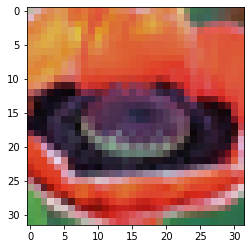

In [ ]:
from matplotlib import pyplot as plt
plt.imshow(example_element['image'].numpy())
plt.grid(False)
_ = plt.show()

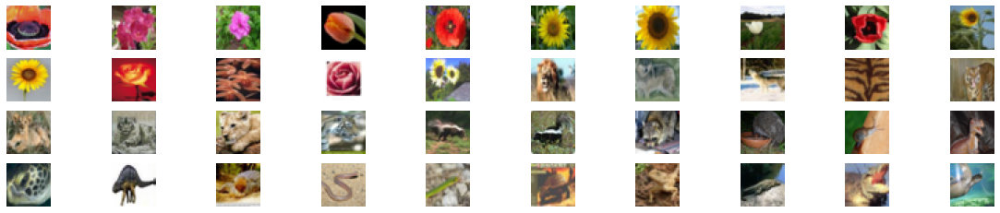

In [ ]:
figure = plt.figure(figsize=(20, 4))
j = 0

for example in example_dataset.take(40):
  plt.subplot(4, 10, j+1)
  plt.imshow(example['image'].numpy(), cmap='gray', aspect='equal')
  plt.axis('off')
  j += 1

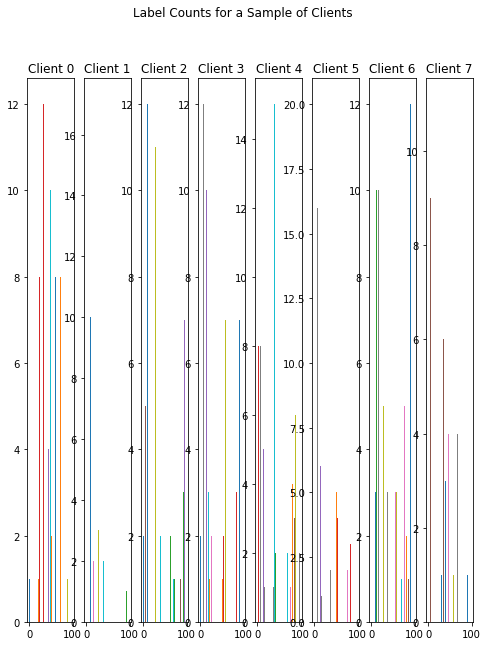

In [ ]:
# Number of examples per layer for a sample of clients
f = plt.figure(figsize=(8,10))
f.suptitle('Label Counts for a Sample of Clients')
for i in range(8):
  client_dataset = emnist_train.create_tf_dataset_for_client(emnist_train.client_ids[i])
  plot_data = collections.defaultdict(list)
  for example in client_dataset:
    label = example['label'].numpy()
    plot_data[label].append(label)
  plt.subplot(1, 8, i+1)
  plt.title('Client {}'.format(i))
  for j in range(100):
    plt.hist(
        plot_data[j],
        density=False,
        bins=range(100))

In [ ]:
NUM_CLIENTS = 10
NUM_EPOCHS = 50
BATCH_SIZE = 20
SHUFFLE_BUFFER = 100
PREFETCH_BUFFER = 10
#Number of rounds = 25
def preprocess(dataset):

  def batch_format_fn(element):
    """Flatten a batch `pixels` and return the features as an `OrderedDict`."""
    return collections.OrderedDict(
        x=tf.reshape(element['image'], [-1, 3072]),
        y=tf.reshape(element['label'], [-1, 1]))

  return dataset.repeat(NUM_EPOCHS).shuffle(SHUFFLE_BUFFER, seed=1).batch(
      BATCH_SIZE).map(batch_format_fn).prefetch(PREFETCH_BUFFER)

In [ ]:
preprocessed_example_dataset = preprocess(example_dataset)

sample_batch = tf.nest.map_structure(lambda x: x.numpy(),
                                     next(iter(preprocessed_example_dataset)))

print(len(sample_batch))
print(sample_batch)


2
OrderedDict([('x', array([[124, 118,  93, ...,  92,  92,  78],
       [192, 187, 171, ...,  45, 107,  77],
       [208, 188, 157, ..., 182, 163, 132],
       ...,
       [221, 243, 251, ...,  61,  80,  75],
       [140, 164, 102, ...,  77, 133,  42],
       [ 59,  74, 108, ..., 164, 146, 134]], dtype=uint8)), ('y', array([[43],
       [62],
       [78],
       [44],
       [74],
       [27],
       [93],
       [27],
       [65],
       [93],
       [80],
       [29],
       [66],
       [27],
       [80],
       [92],
       [70],
       [82],
       [70],
       [80]]))])


In [ ]:
def make_federated_data(client_data, client_ids):
  return [
      preprocess(client_data.create_tf_dataset_for_client(x))
      for x in client_ids
  ]

In [ ]:
sample_clients = emnist_train.client_ids[0:NUM_CLIENTS]

federated_train_data = make_federated_data(emnist_train, sample_clients)

print('Number of client datasets: {l}'.format(l=len(federated_train_data)))
print('First dataset: {d}'.format(d=federated_train_data[2]))

Number of client datasets: 10
First dataset: <PrefetchDataset element_spec=OrderedDict([('x', TensorSpec(shape=(None, 3072), dtype=tf.uint8, name=None)), ('y', TensorSpec(shape=(None, 1), dtype=tf.int64, name=None))])>


Build the model

In [ ]:
def create_keras_model():
  return tf.keras.models.Sequential([
      tf.keras.layers.InputLayer(input_shape=(3072,)),
      tf.keras.layers.Dense(100, kernel_initializer='zeros'),
      tf.keras.layers.Activation('relu'),
      tf.keras.layers.InputLayer(input_shape=(3072,)),
      tf.keras.layers.Activation('relu'),
      tf.keras.layers.Dense(100, kernel_initializer='zeros'),
      tf.keras.layers.Softmax(),
  ])

In [ ]:
def model_fn():
  # We _must_ create a new model here, and _not_ capture it from an external
  # scope. TFF will call this within different graph contexts.
  keras_model = create_keras_model()
  return tff.learning.from_keras_model(
      keras_model,
      input_spec=preprocessed_example_dataset.element_spec,
      loss=tf.keras.losses.SparseCategoricalCrossentropy(),
      metrics=[tf.keras.metrics.SparseCategoricalAccuracy()])

In [ ]:
iterative_process = tff.learning.build_federated_averaging_process(
    model_fn,
    client_optimizer_fn=lambda: tf.keras.optimizers.SGD(learning_rate=0.02),
    server_optimizer_fn=lambda: tf.keras.optimizers.SGD(learning_rate=1.0))

In [ ]:
str(iterative_process.initialize.type_signature)

'( -> <model=<trainable=<float32[3072,100],float32[100],float32[100,100],float32[100]>,non_trainable=<>>,optimizer_state=<int64>,delta_aggregate_state=<value_sum_process=<>,weight_sum_process=<>>,model_broadcast_state=<>>@SERVER)'

In [ ]:
state = iterative_process.initialize()

In [ ]:
import time

In [ ]:
state, metrics = iterative_process.next(state, federated_train_data)
print('round  1\nmetrics={}'.format(metrics))

round  1
metrics=OrderedDict([('broadcast', ()), ('aggregation', OrderedDict([('mean_value', ()), ('mean_weight', ())])), ('train', OrderedDict([('sparse_categorical_accuracy', 0.14138), ('loss', 4.434875)])), ('stat', OrderedDict([('num_examples', 50000)]))])


In [ ]:
NUM_ROUNDS = 25
import time
start_time = time.time()
for round_num in range(2, NUM_ROUNDS):
  state, metrics = iterative_process.next(state, federated_train_data)
  print('round {:2d}\nmetrics={}\n'.format(round_num, metrics))
time_1 = (time.time() - start_time)
print("Total time taken to complete the rounds is %s seconds" % (time_1))

round  2
metrics=OrderedDict([('broadcast', ()), ('aggregation', OrderedDict([('mean_value', ()), ('mean_weight', ())])), ('train', OrderedDict([('sparse_categorical_accuracy', 0.06264), ('loss', 4.1987505)])), ('stat', OrderedDict([('num_examples', 50000)]))])

round  3
metrics=OrderedDict([('broadcast', ()), ('aggregation', OrderedDict([('mean_value', ()), ('mean_weight', ())])), ('train', OrderedDict([('sparse_categorical_accuracy', 0.06286), ('loss', 4.1969585)])), ('stat', OrderedDict([('num_examples', 50000)]))])

round  4
metrics=OrderedDict([('broadcast', ()), ('aggregation', OrderedDict([('mean_value', ()), ('mean_weight', ())])), ('train', OrderedDict([('sparse_categorical_accuracy', 0.06294), ('loss', 4.1952844)])), ('stat', OrderedDict([('num_examples', 50000)]))])

round  5
metrics=OrderedDict([('broadcast', ()), ('aggregation', OrderedDict([('mean_value', ()), ('mean_weight', ())])), ('train', OrderedDict([('sparse_categorical_accuracy', 0.06304), ('loss', 4.1937227)])), 

In [ ]:
logdir = "/tmp/logs/scalars/training/"
summary_writer = tf.summary.create_file_writer(logdir)
state = iterative_process.initialize()

In [ ]:
start_time = time.time()
with summary_writer.as_default():
  for round_num in range(1, NUM_ROUNDS):
    state, metrics = iterative_process.next(state, federated_train_data)
    for name, value in metrics['train'].items():
      tf.summary.scalar(name, value, step=round_num)
time_2 = (time.time() - start_time)
print("Total time taken to complete the rounds is %s seconds" % (time_2))

Total time taken to complete the rounds is 110.94559001922607 seconds


In [ ]:
!ls {logdir}
%tensorboard --logdir {logdir} --port=0

events.out.tfevents.1638475175.860267c2e929.86.0.v2
events.out.tfevents.1638475507.860267c2e929.86.1.v2


<IPython.core.display.Javascript object>

In [ ]:
evaluation = tff.learning.build_federated_evaluation(model_fn)

In [ ]:
str(evaluation.type_signature)

'(<server_model_weights=<trainable=<float32[3072,100],float32[100],float32[100,100],float32[100]>,non_trainable=<>>@SERVER,federated_dataset={<x=uint8[?,3072],y=int64[?,1]>*}@CLIENTS> -> <eval=<sparse_categorical_accuracy=float32,loss=float32>,stat=<num_examples=int64>>@SERVER)'

In [ ]:
start_time = time.time()
train_metrics = evaluation(state.model, federated_train_data)
time_3 = (time.time() - start_time)
print("Total time taken to complete the rounds is %s seconds" % (time_3))

Total time taken to complete the rounds is 7.604733943939209 seconds


In [ ]:
str(train_metrics)

"OrderedDict([('eval', OrderedDict([('sparse_categorical_accuracy', 0.036), ('loss', 4.3301673)])), ('stat', OrderedDict([('num_examples', 50000)]))])"

In [ ]:
print(train_metrics)

OrderedDict([('eval', OrderedDict([('sparse_categorical_accuracy', 0.036), ('loss', 4.3301673)])), ('stat', OrderedDict([('num_examples', 50000)]))])
